In [1]:
from datetime import datetime

from astropy.io import fits,ascii
from astropy.table import Table,QTable
from astropy.visualization import simple_norm
import matplotlib.axes as axes
from matplotlib.backends.backend_pdf import PdfPages
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from photutils.aperture import EllipticalAperture
from photutils.isophote import Ellipse,EllipseGeometry


import warnings
warnings.filterwarnings("ignore")

In [2]:
time_ini = datetime.now()

In [3]:
#imported data directories:
data_dir=f'results/data_sample/'
cuts_dir=f'results/make_postage_stamps/F200W/'
cuts_dir_2=f'results/make_postage_stamps/F444W/'

#results saved in directory:
res_dir=f'results/morphology/'

# 1. Visual classification:

For visualization purposes, we're using a logarithmic normalization (log_a=70). The full description of the funcion LogStretch and its parameters can be found in https://docs.astropy.org/en/stable/api/astropy.visualization.LogStretch.html#logstretch ; here, it's enough to say that the parameter log_a in a stretch/transformation $x\rightarrow y$ is given by: $y=\frac{\log(ax+1)}{\log(a+1)}$

## 1.1. Creating the sample:

We now import the data sample that will be analyzed, located in data_dir. 

In [4]:
table=data_dir+f'data_sample_table_z-3-4.ecsv'
data_sample = ascii.read(table) 

We create a new table with only the relevant information on the galaxies (ID, RA, DEC, z, effective radius in F200W and F444W filters). Then we order it by redshift.

In [5]:
gal_id=[]
ra=[]
dec=[]
z=[]
ref_200=[]
ref_444=[]

for i in range(len(data_sample)):
    gal_id.append(data_sample['ID'][i])
    ra.append(data_sample['RA'][i])
    dec.append(data_sample['DEC'][i])
    z.append(data_sample['z'][i])
    ref_200.append(data_sample['Re_F200W'][i].value)
    ref_444.append(data_sample['Re_F444W'][i].value)

table=QTable()
table['ID']=gal_id
table['RA']=ra
table['DEC']=dec
table['z']=z
table['Re_F200W']=ref_200
table['Re_F444W']=ref_444

table_final=table[np.argsort(table['z'])]

In [6]:
#table with all galaxies ID and questions for visual classification:
#0=NO, 1=YES

#table:
table_excel=Table()
table_excel['Galaxy ID']=table_final['ID']
table_excel['Is it elliptical?']=0
table_excel['Is it a disk?']=0
table_excel['Is it irregular?']=0
table_excel['Is it unresolved?']=0
table_excel['Does it have a bar?']=0
table_excel['Is the morphology different between both bands?']=0

data_frame=table_excel.to_pandas()
data_frame.to_excel(res_dir+'visual_classification.xlsx', index=False)

In [7]:
cuts=[]
for i in range(len(table_final['ID'])):
    file_id=table_final['ID'][i]
    cuts.append(f'{file_id}_cutout.fits')

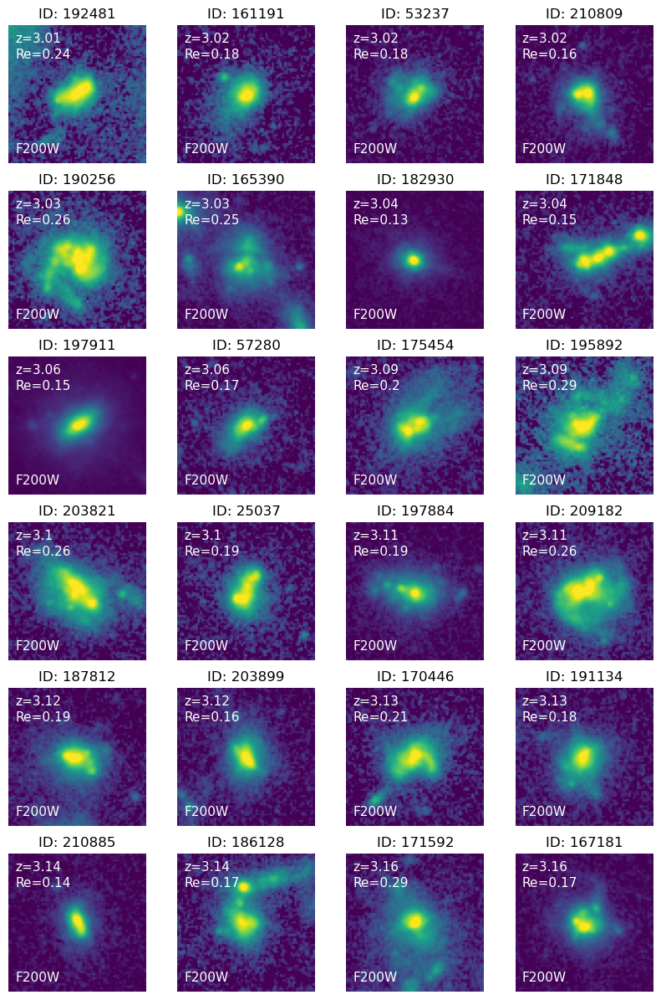

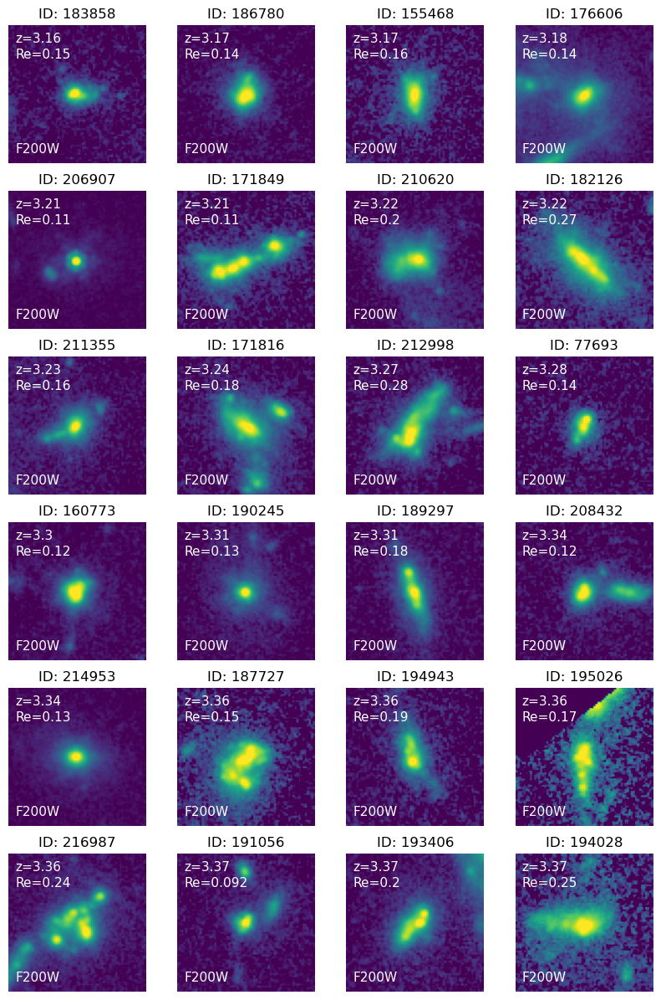

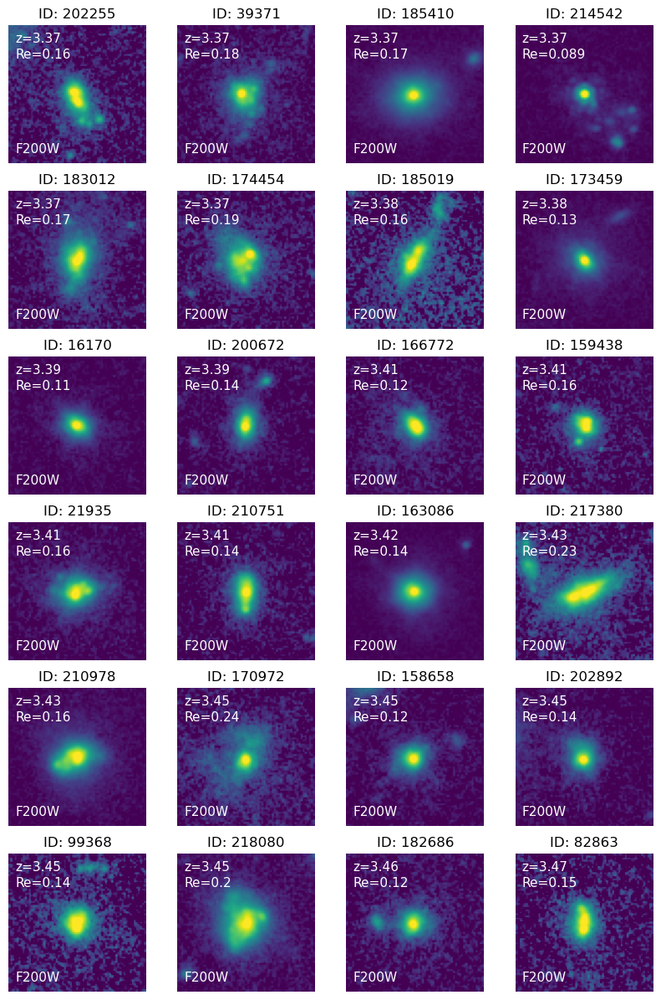

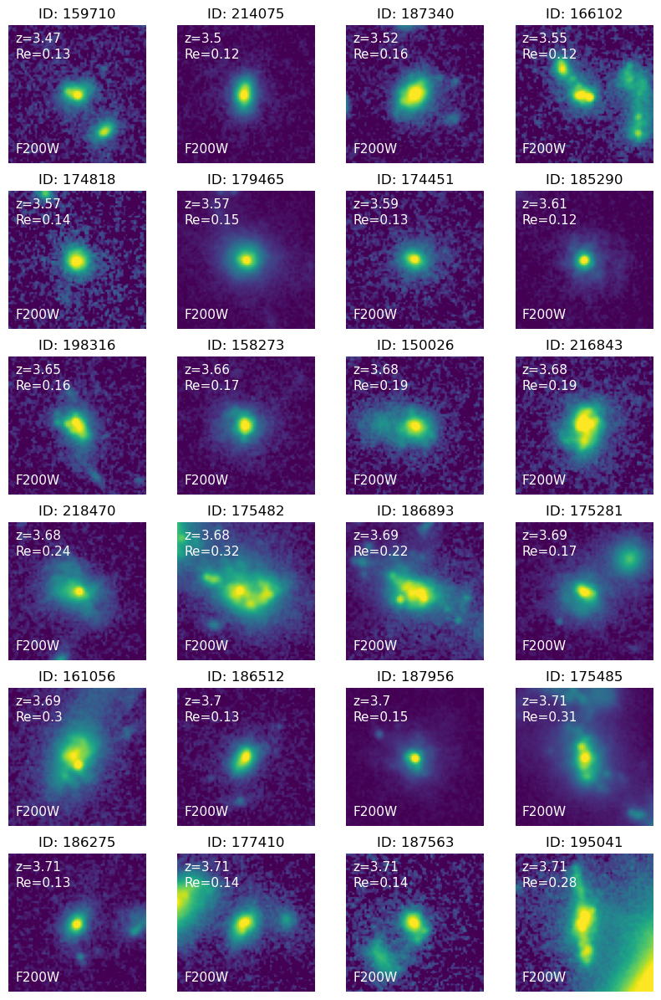

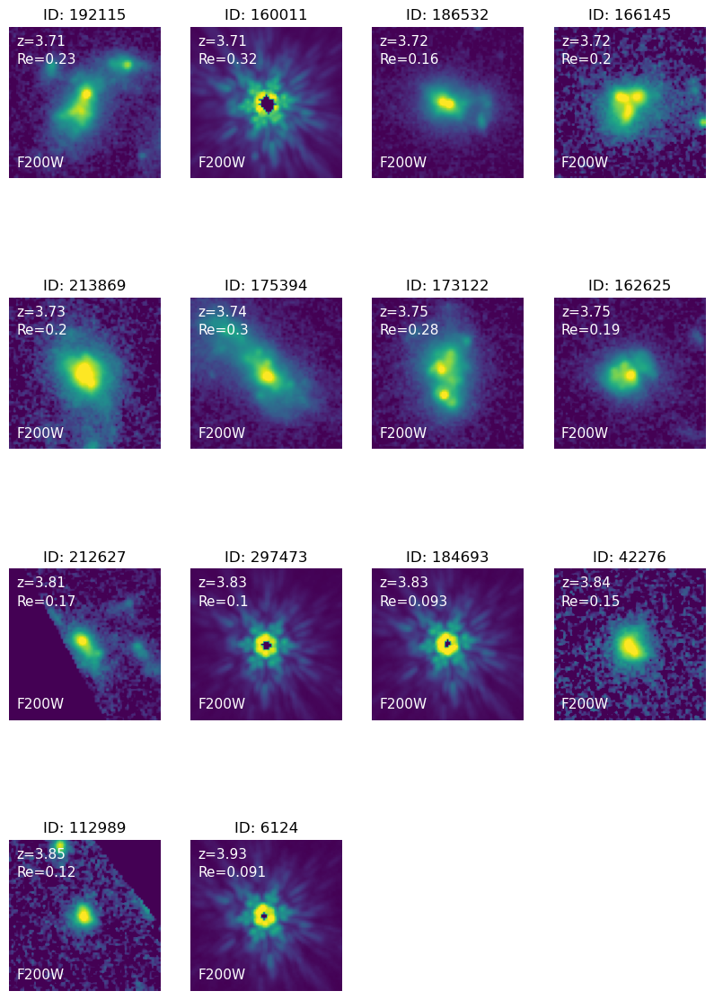

In [8]:
it=0

with PdfPages(res_dir+f'gal_cutouts_F200W.pdf') as pdf:
    
    fig=plt.figure(figsize=(10,15))
    n=0
    
    for file in cuts[0:24]:
        n=n+1
        ax = fig.add_subplot(6,4,n)
        
        #data from file:
        image=cuts_dir+f"{file}"
        hdu_image=fits.open(image)
    
        #data to put in text:
        rs=table_final['z'][it]
        r=table_final['Re_F200W'][it]
        gid=table_final['ID'][it]

        #normalization of data:
        img_max=0.6*np.max(hdu_image[1].data)
        norm = simple_norm(hdu_image[1].data, 'log', log_a=70, min_cut=0, max_cut=img_max)
    
        #plotting figures:
        ax.axis('off')
        ax.set_title(f'ID: {gid}')
        ax.imshow(hdu_image[1].data, origin='lower', cmap='viridis', norm=norm)

        #text:
        text_kwargs = dict(ha='left', va='top', fontsize=11, color='white')
        ax.text(0.05, 0.95, f'z={rs}', transform=ax.transAxes, **text_kwargs)
        ax.text(0.05, 0.83, f'Re={r:.2}', transform=ax.transAxes, **text_kwargs)
        ax.text(0.05, 0.15, f'F200W', transform=ax.transAxes, **text_kwargs)

        it=it+1

    pdf.savefig(bbox_inches="tight")
    
    n=0
    fig=plt.figure(figsize=(10,15))
    for file in cuts[24:48]:
    
        n=n+1
        ax = fig.add_subplot(6,4,n)
        
        #data from file:
        image=cuts_dir+f"{file}"
        hdu_image=fits.open(image)
    
        #data to put in text:
        rs=table_final['z'][it]
        r=table_final['Re_F200W'][it]
        gid=table_final['ID'][it]

        #normalization of data:
        img_max=0.6*np.max(hdu_image[1].data)
        norm = simple_norm(hdu_image[1].data, 'log', log_a=70, min_cut=0, max_cut=img_max)
    
        #plotting figures:
        ax.axis('off')
        ax.set_title(f'ID: {gid}')
        ax.imshow(hdu_image[1].data, origin='lower', cmap='viridis', norm=norm)

        #text:
        text_kwargs = dict(ha='left', va='top', fontsize=11, color='white')
        ax.text(0.05, 0.95, f'z={rs}', transform=ax.transAxes, **text_kwargs)
        ax.text(0.05, 0.83, f'Re={r:.2}', transform=ax.transAxes, **text_kwargs)
        ax.text(0.05, 0.15, f'F200W', transform=ax.transAxes, **text_kwargs)
        
        it=it+1
    
    pdf.savefig(bbox_inches="tight")

    n=0
    fig=plt.figure(figsize=(10,15))    
    for file in cuts[48:72]:
    
        n=n+1
        ax = fig.add_subplot(6,4,n)
        
        #data from file:
        image=cuts_dir+f"{file}"
        hdu_image=fits.open(image)
    
        #data to put in text:
        rs=table_final['z'][it]
        r=table_final['Re_F200W'][it]
        gid=table_final['ID'][it]

        #normalization of data:
        img_max=0.6*np.max(hdu_image[1].data)
        norm = simple_norm(hdu_image[1].data, 'log', log_a=70, min_cut=0, max_cut=img_max)
    
        #plotting figures:
        ax.axis('off')
        ax.set_title(f'ID: {gid}')
        ax.imshow(hdu_image[1].data, origin='lower', cmap='viridis', norm=norm)

        #text:
        text_kwargs = dict(ha='left', va='top', fontsize=11, color='white')
        ax.text(0.05, 0.95, f'z={rs}', transform=ax.transAxes, **text_kwargs)
        ax.text(0.05, 0.83, f'Re={r:.2}', transform=ax.transAxes, **text_kwargs)
        ax.text(0.05, 0.15, f'F200W', transform=ax.transAxes, **text_kwargs)
        
        it=it+1
    
    pdf.savefig(bbox_inches="tight")

    n=0
    fig=plt.figure(figsize=(10,15))
    for file in cuts[72:96]:
    
        n=n+1
        ax = fig.add_subplot(6,4,n)
        
        #data from file:
        image=cuts_dir+f"{file}"
        hdu_image=fits.open(image)
    
        #data to put in text:
        rs=table_final['z'][it]
        r=table_final['Re_F200W'][it]
        gid=table_final['ID'][it]

        #normalization of data:
        img_max=0.6*np.max(hdu_image[1].data)
        norm = simple_norm(hdu_image[1].data, 'log', log_a=70, min_cut=0, max_cut=img_max)
    
        #plotting figures:
        ax.axis('off')
        ax.set_title(f'ID: {gid}')
        ax.imshow(hdu_image[1].data, origin='lower', cmap='viridis', norm=norm)

        #text:
        text_kwargs = dict(ha='left', va='top', fontsize=11, color='white')
        ax.text(0.05, 0.95, f'z={rs}', transform=ax.transAxes, **text_kwargs)
        ax.text(0.05, 0.83, f'Re={r:.2}', transform=ax.transAxes, **text_kwargs)
        ax.text(0.05, 0.15, f'F200W', transform=ax.transAxes, **text_kwargs)
        
        it=it+1
    
    pdf.savefig(bbox_inches="tight")

    n=0
    fig=plt.figure(figsize=(10,15))    
    for file in cuts[96:111]:
    
        n=n+1
        ax = fig.add_subplot(4,4,n)
        
        #data from file:
        image=cuts_dir+f"{file}"
        hdu_image=fits.open(image)
    
        #data to put in text:
        rs=table_final['z'][it]
        r=table_final['Re_F200W'][it]
        gid=table_final['ID'][it]

        #normalization of data:
        img_max=0.6*np.max(hdu_image[1].data)
        norm = simple_norm(hdu_image[1].data, 'log', log_a=70, min_cut=0, max_cut=img_max)
    
        #plotting figures:
        ax.axis('off')
        ax.set_title(f'ID: {gid}')
        ax.imshow(hdu_image[1].data, origin='lower', cmap='viridis', norm=norm)

        #text:
        text_kwargs = dict(ha='left', va='top', fontsize=11, color='white')
        ax.text(0.05, 0.95, f'z={rs}', transform=ax.transAxes, **text_kwargs)
        ax.text(0.05, 0.83, f'Re={r:.2}', transform=ax.transAxes, **text_kwargs)
        ax.text(0.05, 0.15, f'F200W', transform=ax.transAxes, **text_kwargs)
        
        it=it+1
    
    pdf.savefig(bbox_inches="tight")

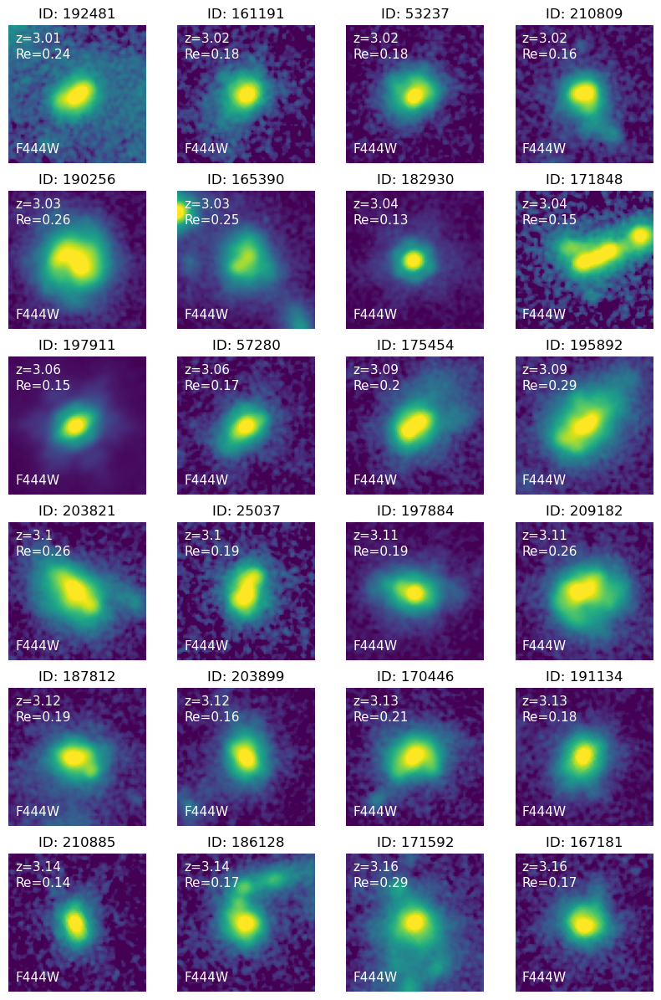

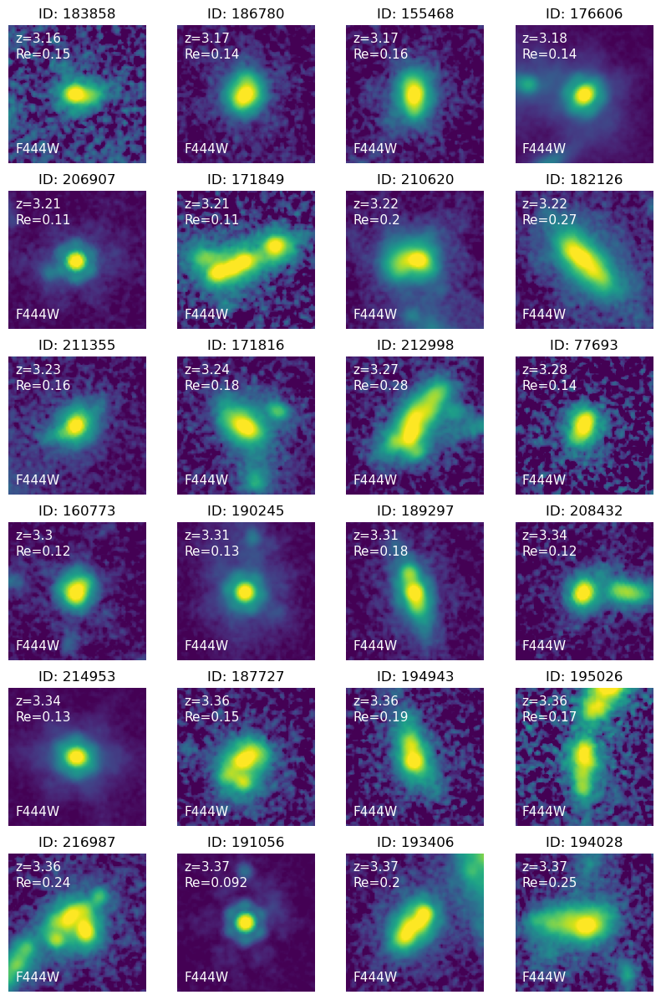

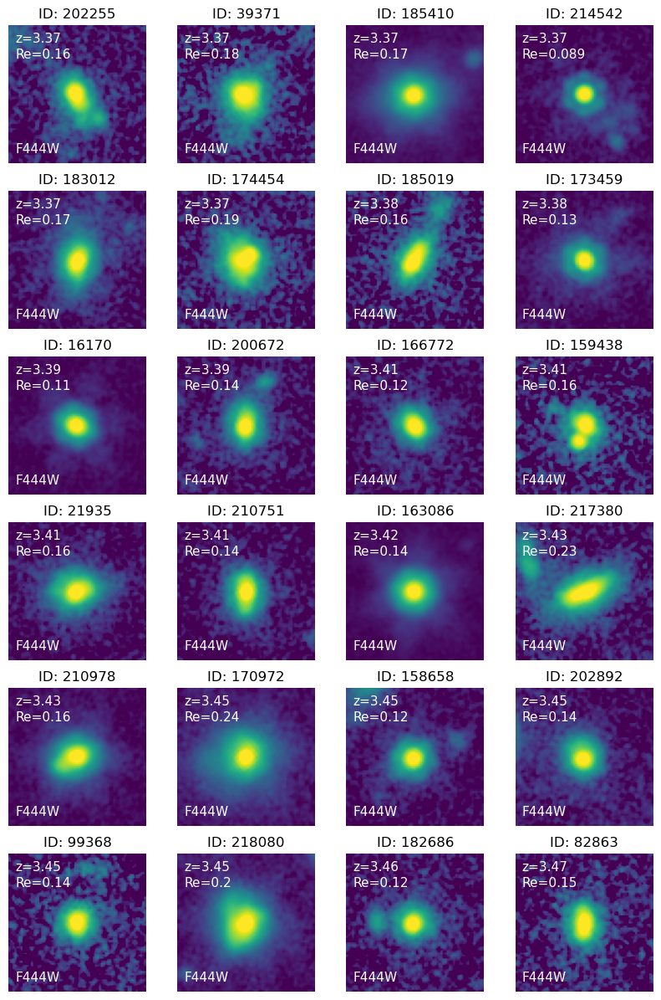

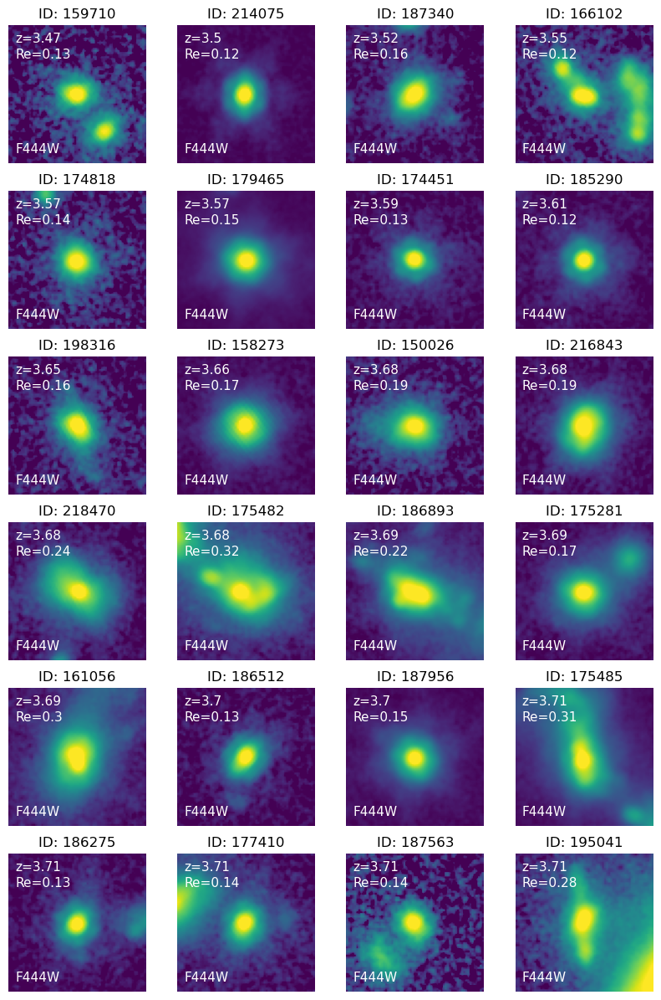

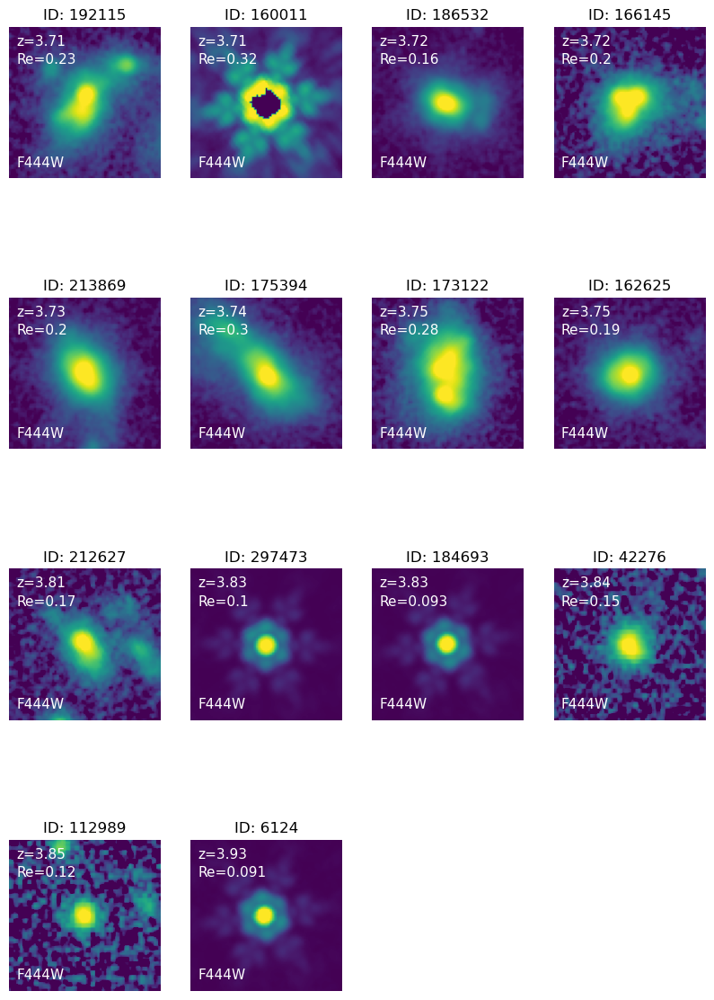

In [9]:
it=0

with PdfPages(res_dir+f'gal_cutouts_F444W.pdf') as pdf:
    
    fig=plt.figure(figsize=(10,15))
    n=0
    
    for file in cuts[0:24]:
        n=n+1
        ax = fig.add_subplot(6,4,n)
        
        #data from file:
        image=cuts_dir_2+f"{file}"
        hdu_image=fits.open(image)
    
        #data to put in text:
        rs=table_final['z'][it]
        r=table_final['Re_F444W'][it]
        gid=table_final['ID'][it]

        #normalization of data:
        img_max=0.6*np.max(hdu_image[1].data)
        norm = simple_norm(hdu_image[1].data, 'log', log_a=70, min_cut=0, max_cut=img_max)
    
        #plotting figures:
        ax.axis('off')
        ax.set_title(f'ID: {gid}')
        ax.imshow(hdu_image[1].data, origin='lower', cmap='viridis', norm=norm)

        #text:
        text_kwargs = dict(ha='left', va='top', fontsize=11, color='white')
        ax.text(0.05, 0.95, f'z={rs}', transform=ax.transAxes, **text_kwargs)
        ax.text(0.05, 0.83, f'Re={r:.2}', transform=ax.transAxes, **text_kwargs)
        ax.text(0.05, 0.15, f'F444W', transform=ax.transAxes, **text_kwargs)

        it=it+1

    pdf.savefig(bbox_inches="tight")
    
    n=0
    fig=plt.figure(figsize=(10,15))
    for file in cuts[24:48]:
    
        n=n+1
        ax = fig.add_subplot(6,4,n)
        
        #data from file:
        image=cuts_dir_2+f"{file}"
        hdu_image=fits.open(image)
    
        #data to put in text:
        rs=table_final['z'][it]
        r=table_final['Re_F444W'][it]
        gid=table_final['ID'][it]

        #normalization of data:
        img_max=0.6*np.max(hdu_image[1].data)
        norm = simple_norm(hdu_image[1].data, 'log', log_a=70, min_cut=0, max_cut=img_max)
    
        #plotting figures:
        ax.axis('off')
        ax.set_title(f'ID: {gid}')
        ax.imshow(hdu_image[1].data, origin='lower', cmap='viridis', norm=norm)

        #text:
        text_kwargs = dict(ha='left', va='top', fontsize=11, color='white')
        ax.text(0.05, 0.95, f'z={rs}', transform=ax.transAxes, **text_kwargs)
        ax.text(0.05, 0.83, f'Re={r:.2}', transform=ax.transAxes, **text_kwargs)
        ax.text(0.05, 0.15, f'F444W', transform=ax.transAxes, **text_kwargs)
        
        it=it+1
    
    pdf.savefig(bbox_inches="tight")

    n=0
    fig=plt.figure(figsize=(10,15))
    for file in cuts[48:72]:
    
        n=n+1
        ax = fig.add_subplot(6,4,n)
        
        #data from file:
        image=cuts_dir_2+f"{file}"
        hdu_image=fits.open(image)
    
        #data to put in text:
        rs=table_final['z'][it]
        r=table_final['Re_F444W'][it]
        gid=table_final['ID'][it]

        #normalization of data:
        img_max=0.6*np.max(hdu_image[1].data)
        norm = simple_norm(hdu_image[1].data, 'log', log_a=70, min_cut=0, max_cut=img_max)
    
        #plotting figures:
        ax.axis('off')
        ax.set_title(f'ID: {gid}')
        ax.imshow(hdu_image[1].data, origin='lower', cmap='viridis', norm=norm)

        #text:
        text_kwargs = dict(ha='left', va='top', fontsize=11, color='white')
        ax.text(0.05, 0.95, f'z={rs}', transform=ax.transAxes, **text_kwargs)
        ax.text(0.05, 0.83, f'Re={r:.2}', transform=ax.transAxes, **text_kwargs)
        ax.text(0.05, 0.15, f'F444W', transform=ax.transAxes, **text_kwargs)
        
        it=it+1
    
    pdf.savefig(bbox_inches="tight")

    n=0
    fig=plt.figure(figsize=(10,15))
    for file in cuts[72:96]:
    
        n=n+1
        ax = fig.add_subplot(6,4,n)
        
        #data from file:
        image=cuts_dir_2+f"{file}"
        hdu_image=fits.open(image)
    
        #data to put in text:
        rs=table_final['z'][it]
        r=table_final['Re_F444W'][it]
        gid=table_final['ID'][it]

        #normalization of data:
        img_max=0.6*np.max(hdu_image[1].data)
        norm = simple_norm(hdu_image[1].data, 'log', log_a=70, min_cut=0, max_cut=img_max)
    
        #plotting figures:
        ax.axis('off')
        ax.set_title(f'ID: {gid}')
        ax.imshow(hdu_image[1].data, origin='lower', cmap='viridis', norm=norm)

        #text:
        text_kwargs = dict(ha='left', va='top', fontsize=11, color='white')
        ax.text(0.05, 0.95, f'z={rs}', transform=ax.transAxes, **text_kwargs)
        ax.text(0.05, 0.83, f'Re={r:.2}', transform=ax.transAxes, **text_kwargs)
        ax.text(0.05, 0.15, f'F444W', transform=ax.transAxes, **text_kwargs)
        
        it=it+1
    
    pdf.savefig(bbox_inches="tight")

    n=0
    fig=plt.figure(figsize=(10,15))
    for file in cuts[96:111]:
    
        n=n+1
        ax = fig.add_subplot(4,4,n)
        
        #data from file:
        image=cuts_dir_2+f"{file}"
        hdu_image=fits.open(image)
    
        #data to put in text:
        rs=table_final['z'][it]
        r=table_final['Re_F444W'][it]
        gid=table_final['ID'][it]

        #normalization of data:
        img_max=0.6*np.max(hdu_image[1].data)
        norm = simple_norm(hdu_image[1].data, 'log', log_a=70, min_cut=0, max_cut=img_max)
    
        #plotting figures:
        ax.axis('off')
        ax.set_title(f'ID: {gid}')
        ax.imshow(hdu_image[1].data, origin='lower', cmap='viridis', norm=norm)

        #text:
        text_kwargs = dict(ha='left', va='top', fontsize=11, color='white')
        ax.text(0.05, 0.95, f'z={rs}', transform=ax.transAxes, **text_kwargs)
        ax.text(0.05, 0.83, f'Re={r:.2}', transform=ax.transAxes, **text_kwargs)
        ax.text(0.05, 0.15, f'F444W', transform=ax.transAxes, **text_kwargs)
        
        it=it+1
    
    pdf.savefig(bbox_inches="tight")

## 1.2. Choosing the candidates for barred galaxies:

We start by importing the classifications done by the three of us and combine it into one matrix. Each matrix containing each classification will be going through some tests in order to assure that there were no mistakes while classifying.

In [10]:
df1=pd.read_excel(res_dir+'visual_classification_CC.xlsx', sheet_name='Sheet1', header=0, index_col=0)
df2=pd.read_excel(res_dir+'visual_classification_LC.xlsx', sheet_name='Sheet1', header=0, index_col=0)
df3=pd.read_excel(res_dir+'visual_classification_LA.xlsx', sheet_name='Sheet1', header=0, index_col=0)

#testing:
df_list=[df1,df2,df3]
list=1

for df in df_list:
    num_rows, num_cols = df.shape
    for row in range(num_rows):
        
        #first test: are all numbers in the matrix = 0 or 1?
        for col in range(num_cols):
            value=df.iloc[row,col]
            if value != 0 and value != 1:
                print(f"FLAG: In data frame {df}, there's a wrong value in position {row},{col}")
        
        #second test: the sum of the first 4 columns has to be =1 for each row/galaxy
        sum_cols = df[['Is it elliptical?', 'Is it a disk?','Is it irregular?','Is it unresolved?']].sum(axis=1)
        value=sum_cols.iloc[row,]
        if value != 1:
            print(f"FLAG: In data frame {df}, galaxy in row {row} is wrongly classified")

        #thrid test: 5th column can only be = 1 if second column is also = 1
        value1=df.iloc[row,4]
        value2=df.iloc[row,1]
        if value1 == 1 and value2 != 1:
            print(f"FLAG: In data frame {list}, galaxy in row {row} is classified as having a bar but NOT being a disk galaxy")
    list+=1

In [11]:
df_sum=df1+df2+df3

#firstly we see how many of each type of galaxy there are; a galaxy is classified of being of one morphology
#if it has 2 or more votes into that morphology; for galaxies being classified as three different 
#morphologies, we create a new class called not_classified

elliptical=0
disk=0
irregular=0
unresolved=0
not_classified=0

max_val_l=[]
max_loc_l=[]

# Iterate through each row of the DataFrame
for index, row in df_sum.iterrows():
    # Find the maximum value in the row
    max_val = row[:4].max()
    # Find the index (column name) where the maximum value occurs
    max_loc = row[:4].idxmax()

    if max_val == 1:
        not_classified+=1
    elif max_val>1 and max_loc == 'Is it elliptical?':
        elliptical+=1
    elif max_val>1 and max_loc == 'Is it a disk?':
        disk+=1
    elif max_val>1 and max_loc == 'Is it irregular?':
        irregular+=1
    elif max_val>1 and max_loc == 'Is it unresolved?':
        unresolved+=1

total_gal=elliptical+disk+irregular+unresolved+not_classified
if total_gal != 110:
    print("FLAG: There was a mistake in labeling the classification of galaxies")

In [12]:
#now, we are going to see how many (and which) disk galaxies have also been classified as having a bar

weak_bar=0
strong_bar=0
very_strong_bar=0
gal_list=[]
gal_list_wb=[]
gal_list_sb=[]
gal_list_vsb=[]

num_rows, num_cols = df_sum.shape
for row in range(num_rows):
    disk_gal=df_sum.iloc[row,1]
    bar=df_sum.iloc[row,4]
    row_name = df_sum.index[row]
    if disk_gal>1 and bar>0:
        gal_list.append(row_name)
        if bar==1:
            weak_bar+=1
            gal_list_wb.append(row_name)
        if bar>1 and bar <3:
            strong_bar+=1
            gal_list_sb.append(row_name)
        elif bar==3:
            gal_list_vsb.append(row_name)
            very_strong_bar+=1

barred_gal=weak_bar+strong_bar+very_strong_bar
no_bar=disk-barred_gal
print(f"There are in total {barred_gal} galaxies classified as being barred; {very_strong_bar} of those are very strongly barred (they have been classified by all 3 of us as having a bar), {strong_bar} of those are strongly barred (they have been classified by 2 of us as having a bar), {weak_bar} of those are classified as weakly barred (only classified by one person as being barred).")

There are in total 30 galaxies classified as being barred; 7 of those are very strongly barred (they have been classified by all 3 of us as having a bar), 14 of those are strongly barred (they have been classified by 2 of us as having a bar), 9 of those are classified as weakly barred (only classified by one person as being barred).


Bar plots of the galaxy morphology distribution:

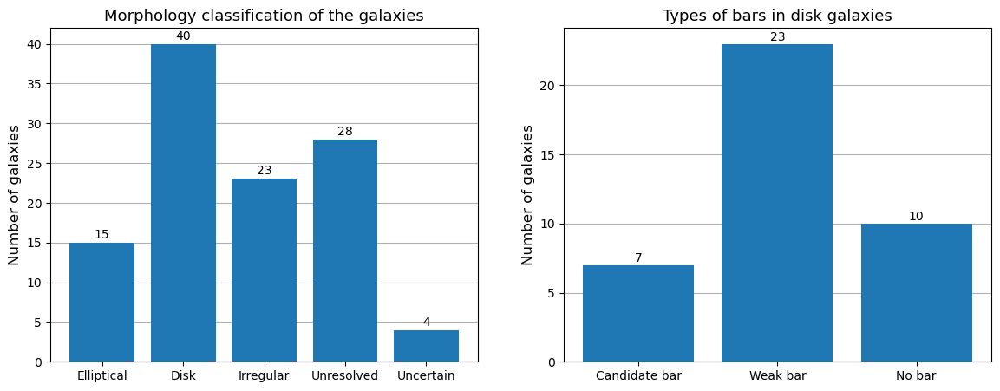

In [13]:
with PdfPages(res_dir+f'morphology_distribution_histograms.pdf') as pdf:

    fig,axs=plt.subplots(1,2,figsize=(14, 5))
    
    #morphologies:
    morphologies = ['Elliptical', 'Disk', 'Irregular', 'Unresolved', 'Uncertain']
    counts = [elliptical, disk, irregular, unresolved, not_classified]
    
    axs[0].bar(morphologies, counts, zorder=2)
    axs[0].grid(axis='y', zorder=1)
    
    axs[0].set_ylabel('Number of galaxies', fontsize=12)
    axs[0].set_title('Morphology classification of the galaxies', fontsize=13)

    axs[0].text('Elliptical', 16, '15', horizontalalignment='center', verticalalignment='center')
    axs[0].text('Disk', 41, '40', horizontalalignment='center', verticalalignment='center')
    axs[0].text('Irregular', 24, '23', horizontalalignment='center', verticalalignment='center')
    axs[0].text('Unresolved', 29, '28', horizontalalignment='center', verticalalignment='center')
    axs[0].text('Uncertain', 5, '4', horizontalalignment='center', verticalalignment='center')
    
    #bar type:
    bar_type = ['Candidate bar', 'Weak bar', 'No bar']
    counts = [very_strong_bar, strong_bar+weak_bar, no_bar]
    
    axs[1].bar(bar_type, counts, zorder=2)
    axs[1].grid(axis='y', zorder=1)
    
    axs[1].set_ylabel('Number of galaxies', fontsize=12)
    axs[1].set_title('Types of bars in disk galaxies', fontsize=13)

    axs[1].text('Candidate bar', 7.5, '7', horizontalalignment='center', verticalalignment='center')
    axs[1].text('Weak bar', 23.5, '23', horizontalalignment='center', verticalalignment='center')
    axs[1].text('No bar', 10.5, '10', horizontalalignment='center', verticalalignment='center')
    
    pdf.savefig(bbox_inches="tight")

In [14]:
print(f"The list of galaxies with very strong bar (3 votes) has {len(gal_list_vsb)} galaxies:")
print(gal_list_vsb)
print("")
print(f"The list of galaxies with strong bar (2 votes) has {len(gal_list_sb)} galaxies:")
print(gal_list_sb)

The list of galaxies with very strong bar (3 votes) has 7 galaxies:
[192481, 203821, 210885, 155468, 210751, 82863, 175485]

The list of galaxies with strong bar (2 votes) has 14 galaxies:
[57280, 203899, 182126, 171816, 189297, 183012, 185019, 200672, 217380, 210978, 198316, 216843, 213869, 175394]


We had made a prior informal classification where we had selected the following as possible candidates for barred galaxies: 210885, 155468, 171816, 203899, 183012, 175485, 210751, 57280, 203821, 187340, 192481, 82863, 182126, 197911.

They are available in the array bellow, that we used for the isophotal analysis:

In [15]:
gal_id_list=[210885, 155468, 171816, 203899, 183012, 175485, 210751, 57280, 203821, 187340, 192481, 82863, 
             182126, 197911]

We now want to check if all the galaxies in the very strong bar list are present in the galaxy list above; we also want to check if the other galaxies in gal_id_list have been classified as having at least a strong bar.

In [16]:
# Convert arrays to sets
set1 = set(gal_id_list)
set2 = set(gal_list_vsb)
set3 = set(gal_list_sb)

#checking if very strong bar galaxies are in gal_id_list:
# Get the intersection of sets
intersection = set1.intersection(set2)

# Check if intersection is empty (i.e., no common values)
if len(intersection) == 0:
    print("No common values found.")
else:
    print(f"From the {len(gal_list_vsb)} galaxies in the very strong bar list, {len(intersection)} of those are also in the first list.")

#checking if the other galaxies in gal_id_list are in the strong bar galaxy list:
# Get the intersection of sets
intersection2 = set1.intersection(set3)

# Check if intersection is empty (i.e., no common values)
if len(intersection2) == 0:
    print("No common values found.")
else:
    print(f"From the other {len(gal_id_list)-len(intersection)} galaxies in the initial galaxy list, {len(intersection2)} of those are strongly barred.")


From the 7 galaxies in the very strong bar list, 7 of those are also in the first list.
From the other 7 galaxies in the initial galaxy list, 5 of those are strongly barred.


In [17]:
#we check those two galaxies that were in our preliminary list but haven't been classified as having very
#strong or strong bars:
set4=set1-intersection-intersection2
set5=set(gal_list_wb)

# Get the intersection of sets
intersection3 = set4.intersection(set5)

# Check if intersection is empty (i.e., no common values)
if len(intersection3) == 0:
    print("No common values found.")
else:
    print(f"From the {len(set4)} other galaxies from our preliminary list, {len(intersection3)} of those are weakly barred: {intersection3}.")

From the 2 other galaxies from our preliminary list, 1 of those are weakly barred: {187340}.


The other galaxy was classified as unresolved, so it's discarded.

# 2. Spectroscopic redshift

We're going to check if there is available spectroscopic redshift for the galaxies selected. We will use IDs present in gal_list, which has all galaxies classified as barred (very strong, strong and weak bars).

In [18]:
obs_dir=f'observations/'

#loading JADES data:
data_jades=obs_dir+f'hlsp_jades_jwst_nirspec_goods-s-deephst_clear-prism_line-fluxes_v1.0_catalog.fits'

#opening extensions 9 (redshifts), 2 (coordinates), 3 (half-light radius or effective radius)
#and 5 (flux in nJy):
with fits.open(data_jades) as hdul:
    header_z=hdul[1].header
    data_z=hdul[1].data

spec_z=data_z['z_Spec']
spec_list=data_z['NIRCam_ID']

z_spec=[]
id_spec=[]

for gal_id in gal_list:
    for i in range(len(spec_list)):
        if spec_list[i]==gal_id:
            z_spec.append(spec_z[i])
            id_spec.append(spec_list[i])

print(f"There are {len(id_spec)} galaxies with spectroscopic redshifts.")

There are 0 galaxies with spectroscopic redshifts.


There are no available spectroscopic redshifts for the selected galaxies. 

# 3. Galaxy list

Finally, we make a table from the galaxy list, with the ID, coordinates and redshift of the selected galaxies:

## 3.1. Premilinary list

In [19]:
gal_id=[]
ra=[]
dec=[]
z=[]

for gal in gal_id_list:
    for i in range(len(table_final['ID'])):
        if table_final['ID'][i]==gal:
            gal_id.append(table_final['ID'][i])
            ra.append(table_final['RA'][i])
            dec.append(table_final['DEC'][i])
            z.append(table_final['z'][i])

gal_list_table=Table()
gal_list_table['ID']=gal_id
gal_list_table['RA']=ra
gal_list_table['DEC']=dec
gal_list_table['z']=z

gal_list_table_final=gal_list_table[np.argsort(gal_list_table['z'])]

gal_list_table_final.write(res_dir+f"gal_visual_class_list.ecsv",overwrite=True)

In [20]:
#We also have to make a table with only ID, RA and DEC to use in script make_postage_stamps to get those 14
#galaxies in all filters:

cut_list_table=Table()
cut_list_table['ID']=gal_list_table['ID']
cut_list_table['RA']=gal_list_table['RA']
cut_list_table['DEC']=gal_list_table['DEC']

cut_list_table.write(res_dir+f"gal_visual_class_list_cut.ecsv",overwrite=True,format="ascii.fast_no_header")

## 3.2. Candidate bar (3 votes)

In [21]:
gal_id=[]
ra=[]
dec=[]
z=[]

for gal in gal_list_vsb:
    for i in range(len(table_final['ID'])):
        if table_final['ID'][i]==gal:
            gal_id.append(table_final['ID'][i])
            ra.append(table_final['RA'][i])
            dec.append(table_final['DEC'][i])
            z.append(table_final['z'][i])

gal_list_table_vsb=Table()
gal_list_table_vsb['ID']=gal_id
gal_list_table_vsb['RA']=ra
gal_list_table_vsb['DEC']=dec
gal_list_table_vsb['z']=z

gal_list_table_vsb_final=gal_list_table_vsb[np.argsort(gal_list_table_vsb['z'])]

gal_list_table_vsb_final.write(res_dir+f"gal_visual_class_list_vsb.ecsv",overwrite=True)

In [22]:
print(gal_list_table_vsb_final)

  ID           RA                 DEC          z  
------ ------------------ ------------------- ----
192481    53.057054694661 -27.831236366012895 3.01
203821    53.126497852496  -27.79435833993597  3.1
210885 53.144680692517596 -27.771186259767443 3.14
155468  53.17803092822548 -27.735530712891165 3.17
210751  53.18807409359747 -27.771594051937026 3.41
 82863 53.136811461577594 -27.838051192309223 3.47
175485 53.097274109361635  -27.86585158763714 3.71


In [23]:
#We also have to make a table with only ID, RA and DEC to use in script make_postage_stamps to get those 14
#galaxies in all filters:

cut_list_table_vsb=Table()
cut_list_table_vsb['ID']=gal_list_table_vsb['ID']
cut_list_table_vsb['RA']=gal_list_table_vsb['RA']
cut_list_table_vsb['DEC']=gal_list_table_vsb['DEC']

cut_list_table_vsb.write(res_dir+f"gal_visual_class_list_vsb_cut.ecsv",overwrite=True,
                     format="ascii.fast_no_header")

## 3.3. Weak bar (2 votes)

In [24]:
gal_id=[]
ra=[]
dec=[]
z=[]

for gal in gal_list_sb:
    for i in range(len(table_final['ID'])):
        if table_final['ID'][i]==gal:
            gal_id.append(table_final['ID'][i])
            ra.append(table_final['RA'][i])
            dec.append(table_final['DEC'][i])
            z.append(table_final['z'][i])

gal_list_table_sb=Table()
gal_list_table_sb['ID']=gal_id
gal_list_table_sb['RA']=ra
gal_list_table_sb['DEC']=dec
gal_list_table_sb['z']=z

gal_list_table_sb_final=gal_list_table_sb[np.argsort(gal_list_table_sb['z'])]

gal_list_table_sb_final.write(res_dir+f"gal_visual_class_list_sb.ecsv",overwrite=True)

In [25]:
#We also have to make a table with only ID, RA and DEC to use in script make_postage_stamps to get those 14
#galaxies in all filters:

cut_list_table_sb=Table()
cut_list_table_sb['ID']=gal_list_table_sb['ID']
cut_list_table_sb['RA']=gal_list_table_sb['RA']
cut_list_table_sb['DEC']=gal_list_table_sb['DEC']

cut_list_table_sb.write(res_dir+f"gal_visual_class_list_sb_cut.ecsv",overwrite=True,
                     format="ascii.fast_no_header")

# 4. Example cutouts of galaxies

We choose three galaxies as examples of each category (elliptical,disk,irregular,unresolved,uncertain). When possible, we choose galaxies that have had three votes.

In [26]:
gal_list_ellip=[]
gal_list_disk=[]
gal_list_irr=[]
gal_list_unres=[]
gal_list_notclas=[]

num_rows, num_cols = df_sum.shape

for row in range(num_rows):
    ellip_gal=df_sum.iloc[row,0]
    disk_gal=df_sum.iloc[row,1]
    irr_gal=df_sum.iloc[row,2]
    unres_gal=df_sum.iloc[row,3]
    max_val = df_sum.iloc[row,:4].max()
    row_name = df_sum.index[row]
    if ellip_gal==3:
        gal_list_ellip.append(row_name)
    elif disk_gal==3:
        gal_list_disk.append(row_name)
    elif irr_gal==3:
        gal_list_irr.append(row_name)
    elif unres_gal==3:
        gal_list_unres.append(row_name)
    elif max_val==1:
        gal_list_notclas.append(row_name)
        
print(f"The number of elliptical galaxies with three votes is: {len(gal_list_ellip)}.")
print(f"The number of disk galaxies with three votes is: {len(gal_list_disk)}.")
print(f"The number of irregular galaxies with three votes is: {len(gal_list_irr)}.")
print(f"The number of unresolved galaxies with three votes is: {len(gal_list_unres)}.")
print(f"The number of uncertain galaxies is: {len(gal_list_notclas)}.")

The number of elliptical galaxies with three votes is: 6.
The number of disk galaxies with three votes is: 16.
The number of irregular galaxies with three votes is: 18.
The number of unresolved galaxies with three votes is: 24.
The number of uncertain galaxies is: 4.


In [27]:
#we create a new excel document with the total visual classification:
df_sum.to_excel(res_dir+'visual_classification_all.xlsx', index=True)

There are enough galaxies (we only need three of each), so we can extract the cutouts; first, we'll cut down the lists above so they only have three galaxies each.

In [28]:
ellip_list=[]
disk_list=[]
irr_list=[]
unres_list=[]
notclas_list=[]

for i in range(3):
    ellip_list.append(gal_list_ellip[i])
    disk_list.append(gal_list_disk[i])
    irr_list.append(gal_list_irr[i])
    unres_list.append(gal_list_unres[i])
    notclas_list.append(gal_list_notclas[i])

cutout_ex_list=ellip_list+disk_list+irr_list+unres_list+notclas_list

In [29]:
gal_id=[]
ra=[]
dec=[]
z=[]

for gal in cutout_ex_list:
    for i in range(len(table_final['ID'])):
        if table_final['ID'][i]==gal:
            gal_id.append(table_final['ID'][i])
            ra.append(table_final['RA'][i])
            dec.append(table_final['DEC'][i])
            z.append(table_final['z'][i])

gal_list_table_ex=Table()
gal_list_table_ex['ID']=gal_id
gal_list_table_ex['RA']=ra
gal_list_table_ex['DEC']=dec
gal_list_table_ex['z']=z

gal_list_table_ex.write(res_dir+f"gal_visual_class_list_ex.ecsv",overwrite=True)

In [30]:
#We also have to make a table with only ID, RA and DEC to use in script make_postage_stamps to get those 14
#galaxies in all filters:

cut_list_table_ex=Table()
cut_list_table_ex['ID']=gal_list_table_ex['ID']
cut_list_table_ex['RA']=gal_list_table_ex['RA']
cut_list_table_ex['DEC']=gal_list_table_ex['DEC']

cut_list_table_ex.write(res_dir+f"gal_visual_class_list_ex_cut.ecsv",overwrite=True,
                     format="ascii.fast_no_header")

We have to run this list through make_postage_stamps to create cutouts; we start with F200W filter:

In [31]:
#%run make_postage_stamps.py --infile observations/JWST_filters/hlsp_jades_jwst_nircam_goods-s-deep_f200w_v2.0_drz.fits --coordfile results/morphology/gal_visual_class_list_ex_cut.ecsv --xycut 2 --overwrite True 

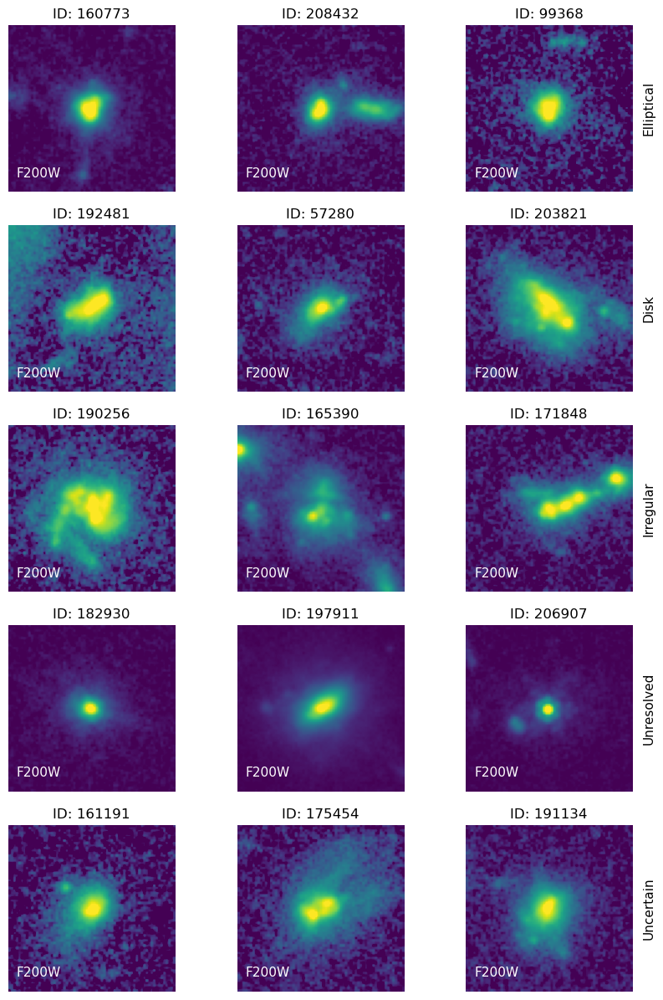

In [32]:
gal_list=cut_list_table_ex['ID']

#text with classification of galaxies to put in the plots:
text_clas=['','','Elliptical','','','Disk','','','Irregular','','','Unresolved','','','Uncertain']

with PdfPages(res_dir+f'gal_examples_cutouts_F200W.pdf') as pdf:

    #F200W filter:
    fig=plt.figure(figsize=(10,15))
    n=0
    
    for gal in gal_list:
        n+=1
        ax = fig.add_subplot(5,3,n)
        
        #data from file:
        image=cuts_dir+f"{gal}_cutout.fits"
        hdu_image=fits.open(image)
    
        #data to put in text:
        gid=cut_list_table_ex['ID'][n-1]

        #normalization of data:
        img_max=0.6*np.max(hdu_image[1].data)
        norm = simple_norm(hdu_image[1].data, 'log', log_a=70, min_cut=0, max_cut=img_max)
    
        #plotting figures:
        ax.axis('off')
        ax.set_title(f'ID: {gid}')
        ax.imshow(hdu_image[1].data, origin='lower', cmap='viridis', norm=norm)

        #text:
        text_kwargs = dict(ha='left', va='top', fontsize=11, color='white')
        text_clas_kwargs = dict(ha='center', va='center', fontsize=11, color='black',rotation='vertical')
        ax.text(0.05, 0.15, 'F200W', transform=ax.transAxes, **text_kwargs)
        ax.text(1.1, 0.5, f'{text_clas[n-1]}', transform=ax.transAxes, **text_clas_kwargs)

    pdf.savefig(bbox_inches="tight")
        

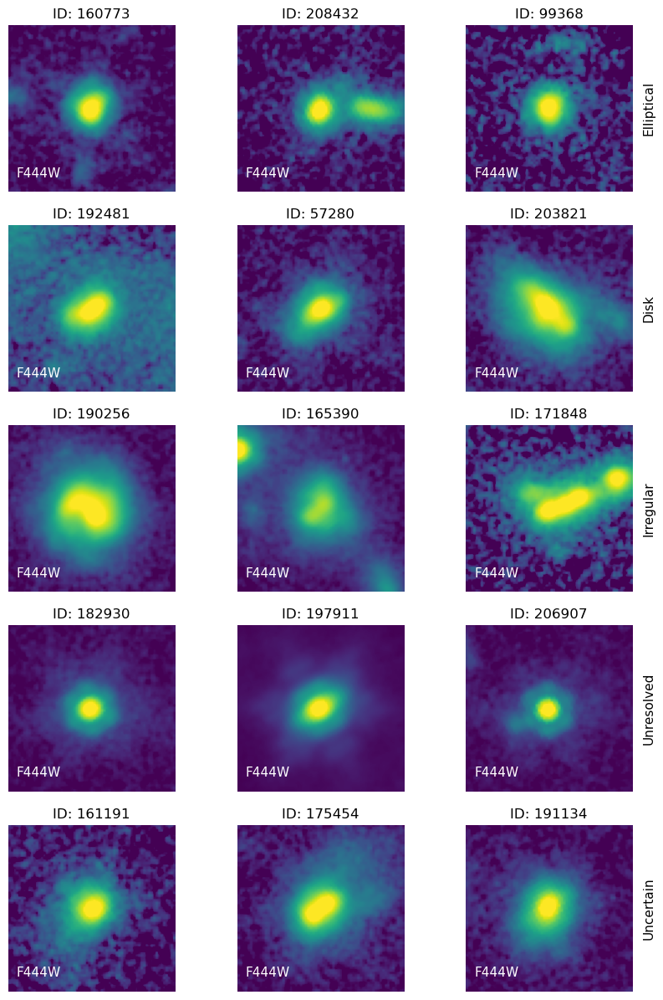

In [33]:
with PdfPages(res_dir+f'gal_examples_cutouts_F444W.pdf') as pdf:

    #F200W filter:
    fig=plt.figure(figsize=(10,15))
    n=0
    
    for gal in gal_list:
        n+=1
        ax = fig.add_subplot(5,3,n)
        
        #data from file:
        image=cuts_dir_2+f"{gal}_cutout.fits"
        hdu_image=fits.open(image)
    
        #data to put in text:
        gid=cut_list_table_ex['ID'][n-1]

        #normalization of data:
        img_max=0.6*np.max(hdu_image[1].data)
        norm = simple_norm(hdu_image[1].data, 'log', log_a=70, min_cut=0, max_cut=img_max)
    
        #plotting figures:
        ax.axis('off')
        ax.set_title(f'ID: {gid}')
        ax.imshow(hdu_image[1].data, origin='lower', cmap='viridis', norm=norm)

        #text:
        text_kwargs = dict(ha='left', va='top', fontsize=11, color='white')
        text_clas_kwargs = dict(ha='center', va='center', fontsize=11, color='black',rotation='vertical')
        ax.text(0.05, 0.15, 'F444W', transform=ax.transAxes, **text_kwargs)
        ax.text(1.1, 0.5, f'{text_clas[n-1]}', transform=ax.transAxes, **text_clas_kwargs)

    pdf.savefig(bbox_inches="tight")
        

In [34]:
time_end = datetime.now()
print(f"Initial time...: {time_ini}")
print(f"Final time.....: {time_end}")
print(f"Excecution time: {time_end-time_ini}")

Initial time...: 2024-06-02 17:14:21.482932
Final time.....: 2024-06-02 17:15:07.883510
Excecution time: 0:00:46.400578
